In [51]:
# Import packages

import os
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
#from nltk.tokenize import word_tokenize
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
import re

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# Initialize variables
tweet_count = 5000
username = 'elonmusk'
since_date = '2022-01-01'

# Using OS library to get tweets from a username since a date
os.system(f'snscrape --jsonl --since {since_date} twitter-search "from:{username}"> musk_tweets_2022.json');

In [4]:
tweets_df = pd.read_json('musk_tweets_2022.json', lines=True)




In [5]:
#check variables
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4115 entries, 0 to 4114
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   _type             4115 non-null   object             
 1   url               4115 non-null   object             
 2   date              4115 non-null   datetime64[ns, UTC]
 3   content           4115 non-null   object             
 4   renderedContent   4115 non-null   object             
 5   id                4115 non-null   int64              
 6   user              4115 non-null   object             
 7   replyCount        4115 non-null   int64              
 8   retweetCount      4115 non-null   int64              
 9   likeCount         4115 non-null   int64              
 10  quoteCount        4115 non-null   int64              
 11  conversationId    4115 non-null   int64              
 12  lang              4115 non-null   object             
 13  sou

In [6]:
# show the key statistics in comparison of Elon and the others (retweet count, likecount)
# Get the top mentioned users for each follower
# get the content most important words

In [7]:
#get the statistic metrics

tweets_df.describe()

,id,replyCount,retweetCount,likeCount,quoteCount,conversationId,retweetedTweet,inReplyToTweetId,coordinates,place,cashtags
count,4.115000e+03,4115.000000,4115.000000,4.115000e+03,4115.000000,4.115000e+03,0.0,3.443000e+03,0.0,0.0,0.0
mean,1.549092e+18,5489.191738,6786.184204,8.243126e+04,1234.751883,1.545769e+18,NaN,1.547445e+18,NaN,NaN,NaN
std,3.573717e+16,14738.396279,22375.122315,2.065060e+05,5776.769558,5.762065e+16,NaN,4.774329e+16,NaN,NaN,NaN
min,1.477080e+18,0.000000,39.000000,9.250000e+02,3.000000,2.623659e+17,NaN,2.623659e+17,NaN,NaN,NaN
25%,1.521434e+18,450.000000,324.500000,6.682500e+03,38.000000,1.520561e+18,NaN,1.520798e+18,NaN,NaN,NaN
50%,1.549106e+18,1061.000000,919.000000,1.792300e+04,106.000000,1.548033e+18,NaN,1.548050e+18,NaN,NaN,NaN
75%,1.584529e+18,4051.000000,4117.000000,6.642100e+04,514.500000,1.584190e+18,NaN,1.584539e+18,NaN,NaN,NaN
max,1.598158e+18,318706.000000,676500.000000,4.749784e+06,179724.000000,1.598158e+18,NaN,1.598155e+18,NaN,NaN,NaN


In [8]:
tweets_red = tweets_df[['replyCount', 'retweetCount', 'likeCount']]

tweets_red.round(5)
tweets_red.describe()

,replyCount,retweetCount,likeCount
count,4115.000000,4115.000000,4.115000e+03
mean,5489.191738,6786.184204,8.243126e+04
std,14738.396279,22375.122315,2.065060e+05
min,0.000000,39.000000,9.250000e+02
25%,450.000000,324.500000,6.682500e+03
50%,1061.000000,919.000000,1.792300e+04
75%,4051.000000,4117.000000,6.642100e+04
max,318706.000000,676500.000000,4.749784e+06


(0.0, 10000.0)

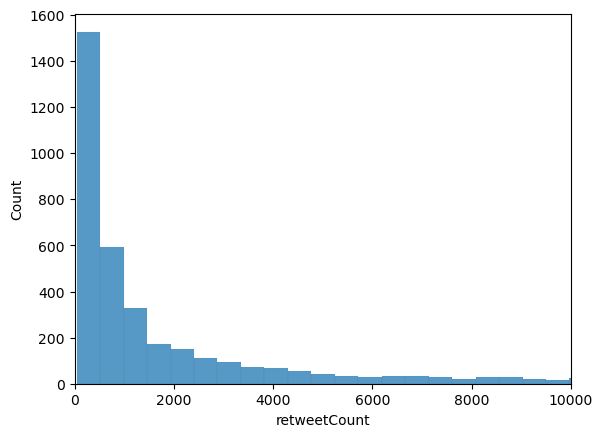

In [9]:
#Checking the distribution of likes and retweets
sns.histplot(x='retweetCount', data=tweets_df);
#outlier.boxplot(column =['retweetCount'], grid = True)
#plt.ylim(0, 20000)
plt.xlim(0, 10000)

(0.0, 70000.0)

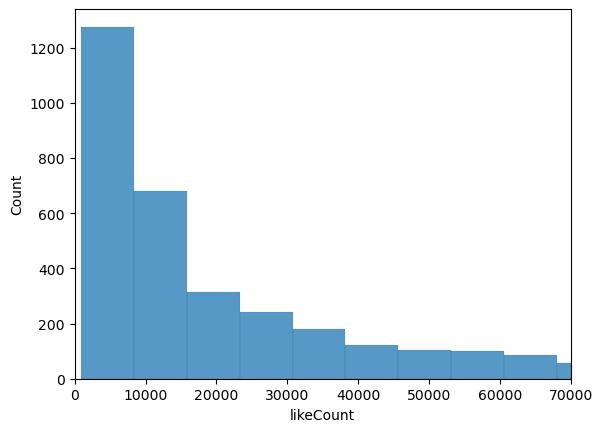

In [10]:
sns.histplot(x='likeCount', data=tweets_df);

#plt.ylim(0, 20000)
plt.xlim(0, 70000)

(0.0, 10000.0)

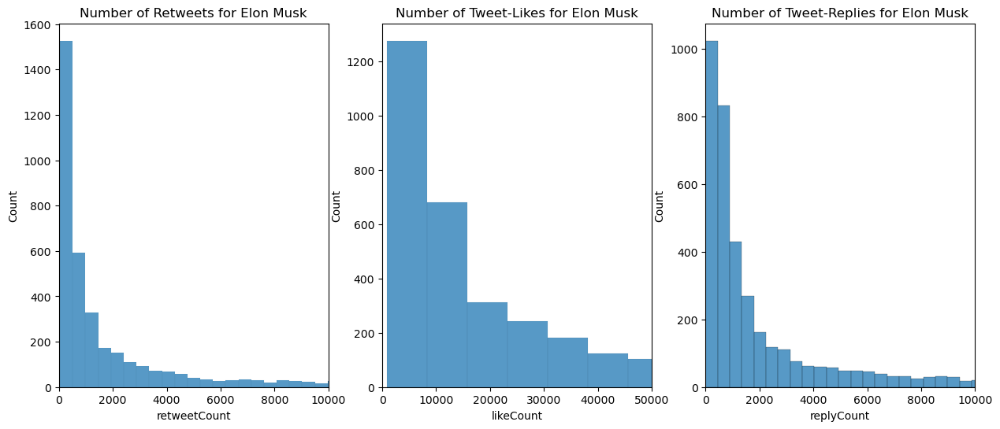

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(15, 6))
sns.histplot(x='retweetCount', data=tweets_df, ax=ax[0])
ax[0].set_title('Number of Retweets for Elon Musk')
ax[0].set_xlim(0, 10000)

sns.histplot(x='likeCount', data=tweets_df, ax=ax[1])
ax[1].set_title('Number of Tweet-Likes for Elon Musk')
ax[1].set_xlim(0, 50000)

#plt.ylim(0, 2000)
plt.xlim(0, 70000)
sns.histplot(x='replyCount', data=tweets_df, ax=ax[2]);
ax[2].set_title('Number of Tweet-Replies for Elon Musk')
ax[2].set_xlim(0, 10000)



<AxesSubplot:>

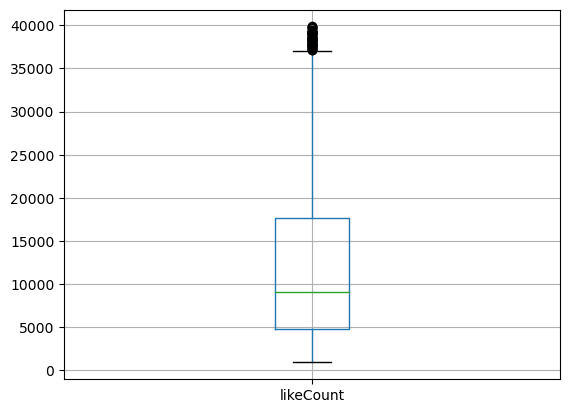

In [12]:
#Boxplot for the Likecount
outlier = tweets_df[tweets_df['likeCount'] < 40000]
outlier.boxplot(column =['likeCount'], grid = True)

<AxesSubplot:>

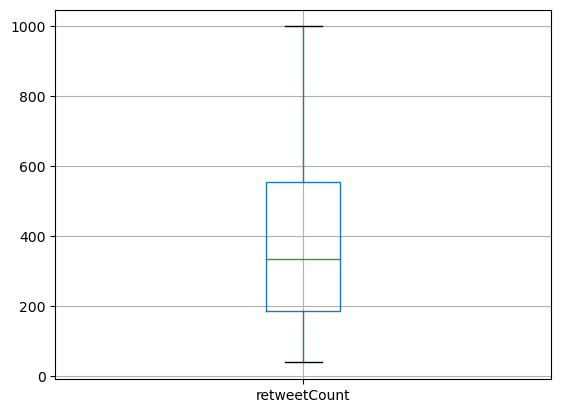

In [13]:
#Boxplot for retweetCount
outlier = tweets_df[tweets_df['retweetCount'] < 1000]
outlier.boxplot(column =['retweetCount'], grid = True)

(0.0, 1000.0)

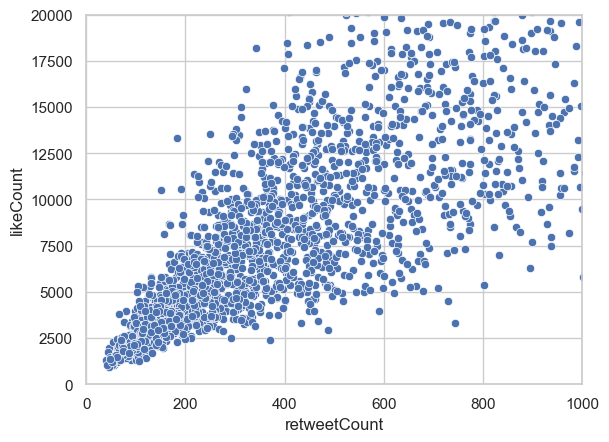

In [14]:

sns.set(style='whitegrid')
 
sns.scatterplot(x="retweetCount",
                    y="likeCount",
                    data=tweets_df)
plt.ylim(0, 20000)
plt.xlim(0, 1000)

In [15]:
pd.options.display.max_colwidth = 200
#print(tweets_df['mentionedUsers'])
pd.set_option('display.max_rows', tweets_df.shape[0]+1)
#print(tweets_df['hashtags'])

In [50]:
for row in tweets_df["content"]:
    print(row)

Twitter is purging a lot of spam/scam accounts right now, so you may see your follower count drop
@EvaFoxU Exactly
@ashleevance We are now confident that the Neuralink device is ready for humans, so timing is a function of working through the FDA approval process
@ashleevance Yup
Exciting Neuralink update in 30 mins! https://t.co/5NYAyjP8mh
@SawyerMerritt @woodhaus2 😉
@SawyerMerritt Congratulations @jimfarley98 @Ford!
Good conversation. Among other things, we resolved the misunderstanding about Twitter potentially being removed from the App Store. Tim was clear that Apple never considered doing so.
@jhall Cancel culture needs to be canceled!!
@teslaownersSV Wow, thank you for the kind words @reedhastings
@HistoryInPics Feels like an eternity ago
Thanks @tim_cook for taking me around Apple’s beautiful HQ https://t.co/xjo4g306gR
@EvaFoxU @Reuters Exactly. The obvious reality, as long-time users know, is that Twitter has failed in trust &amp; safety for a very long time and has interfered

In [42]:

stop_words = set(stopwords.words('english'))

#stopwords = stopwords.words('english')+[" ", "based", "regarding", "good", "right", "even", ""]
#print(stop_words)

In [43]:
#saving the Tweet-content in a string variable
x = str(tweets_df["content"])  


#Step 1: tokenizing the string and appending it into a list
token = word_tokenize(x)
#jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

In [44]:
#Step 2: running a regex to keep only alphanumeric
l=[]
for i in range(len(token)):
    l.append(re.sub(r'\W+', '', token[i]))


In [45]:
print(l)

['0', 'Twitter', 'is', 'purging', 'a', 'lot', 'of', 'spamscam', 'accounts', 'right', 'now', '', 'so', 'you', 'may', 'see', 'your', 'follower', 'count', 'drop', '1', '', 'EvaFoxU', 'Exactly', '2', '', 'ashleevance', 'We', 'are', 'now', 'confident', 'that', 'the', 'Neuralink', 'device', 'is', 'ready', 'for', 'humans', '', 'so', 'timing', 'is', 'a', 'function', 'of', 'working', 'through', 'the', 'FDA', 'approval', 'process', '3', '', 'ashleevance', 'Yup', '4', 'Exciting', 'Neuralink', 'update', 'in', '30', 'mins', '', 'https', '', 'tco5NYAyjP8mh', '5', '', 'SawyerMerritt', '', 'woodhaus2', '', '6', '', 'SawyerMerritt', 'Congratulations', '', 'jimfarley98', '', 'Ford', '', '7', 'Good', 'conversation', '', 'Among', 'other', 'things', '', 'we', 'resolved', 'the', 'misunderstanding', 'about', 'Twitter', 'potentially', 'being', 'removed', 'from', 'the', 'App', 'Store', '', 'Tim', 'was', 'clear', 'that', 'Apple', 'never', 'considered', 'doing', 'so', '', '8', '', 'jhall', 'Cancel', 'culture', '

In [46]:


#putting list back into a string
#token_2 = (" ".join(l))

#getting the stop words list in english
stop_words = set(stopwords.words('english'))

#selecting only words that are not stop words
filtered = []
for w in l:
    if w.lower() not in stop_words:
        filtered.append(w)
print(filtered) 
#print(word_tokens)
#print(filtered_sentence)'''

['0', 'Twitter', 'purging', 'lot', 'spamscam', 'accounts', 'right', '', 'may', 'see', 'follower', 'count', 'drop', '1', '', 'EvaFoxU', 'Exactly', '2', '', 'ashleevance', 'confident', 'Neuralink', 'device', 'ready', 'humans', '', 'timing', 'function', 'working', 'FDA', 'approval', 'process', '3', '', 'ashleevance', 'Yup', '4', 'Exciting', 'Neuralink', 'update', '30', 'mins', '', 'https', '', 'tco5NYAyjP8mh', '5', '', 'SawyerMerritt', '', 'woodhaus2', '', '6', '', 'SawyerMerritt', 'Congratulations', '', 'jimfarley98', '', 'Ford', '', '7', 'Good', 'conversation', '', 'Among', 'things', '', 'resolved', 'misunderstanding', 'Twitter', 'potentially', 'removed', 'App', 'Store', '', 'Tim', 'clear', 'Apple', 'never', 'considered', '', '8', '', 'jhall', 'Cancel', 'culture', 'needs', 'canceled', '', '', '9', '', 'teslaownersSV', 'Wow', '', 'thank', 'kind', 'words', '', 'reedhastings', '10', '', 'HistoryInPics', 'Feels', 'like', 'eternity', 'ago', '11', 'Thanks', '', 'tim_cook', 'taking', 'around',

In [47]:
word_dic = {}
for i in filtered:
    if i in word_dic:
        word_dic[i] +=1
    else:
        word_dic[i] = 1



In [48]:
s = {k: v for k, v in sorted(word_dic.items(), key=lambda item: item[1], reverse=True)}
print(s)

{'': 12332, 'https': 447, 'Twitter': 316, 'amp': 291, 'Tesla': 241, 'WholeMarsBlog': 215, 'BillyM2k': 205, 'teslaownersSV': 179, 'SpaceX': 139, 'PPathole': 131, 'people': 115, 'would': 101, 'EvaFoxU': 89, 'Yes': 87, 'SawyerMerritt': 82, 'like': 80, 'much': 80, 'many': 79, 'one': 75, 'time': 74, 'Starlink': 74, 'good': 70, 'Exactly': 62, 'even': 60, 'Yeah': 60, 'make': 59, 'think': 58, 'True': 58, 'great': 56, 'Good': 54, 'work': 54, 'Rainmaker1973': 51, 'Teslarati': 51, 'right': 50, 'year': 50, 'waitbutwhy': 49, 'far': 48, 'team': 47, 'spideycyp_155': 46, 'high': 45, 'next': 45, 'cb_doge': 43, 'get': 43, 'way': 42, 'lot': 41, 'nichegamer': 41, 'still': 41, 'stillgray': 40, 'also': 40, 'better': 40, 'best': 40, 'years': 40, 'real': 39, 'actually': 39, 'Earth': 39, 'probably': 38, 'week': 38, 'Yup': 37, 'JohnnaCrider1': 37, 'pmarca': 37, 'working': 36, 'know': 36, 'Erdayastronaut': 36, 'times': 35, 'Maybe': 35, 'stevenmarkryan': 34, 'slashdot': 34, 'life': 34, 'DavidSacks': 33, 'ICannot_

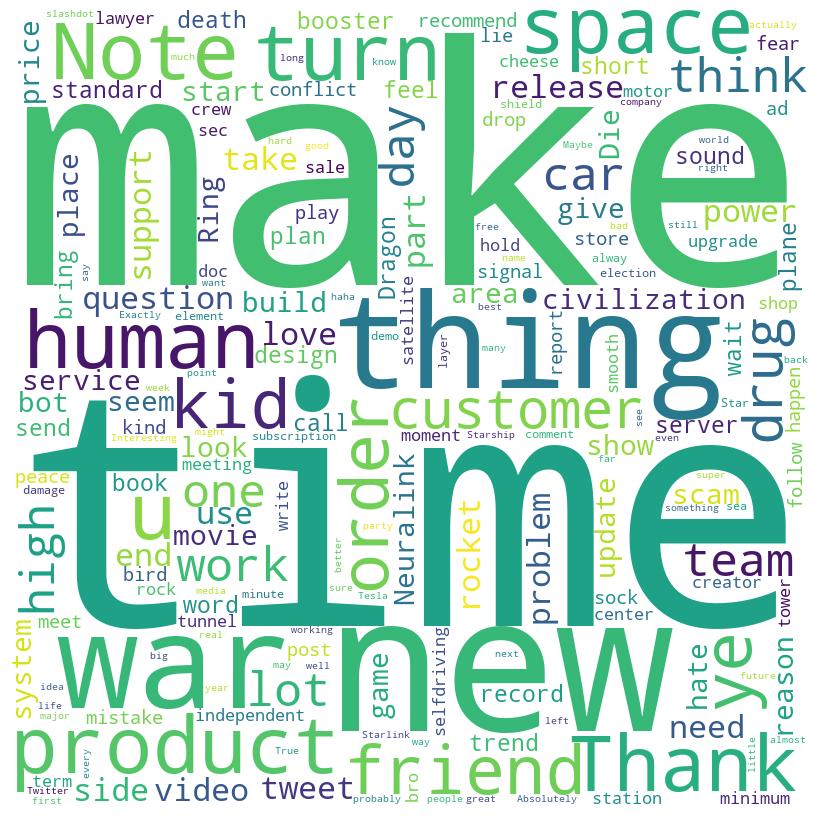

In [53]:
#Wordcloud
comment_words = ''
stopwords = set(STOPWORDS)

 

#putting list back into a string
token_2 = (" ".join(s))

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(token_2)
 


plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [73]:
tweets_df



,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972372021248,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'veri...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'ver...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869910253569,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'v...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, '...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111470252032,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stating the obvious","@teslaownersSV Much more, but I am simply stating the obvious",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'desc...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558073667584,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'disp

In [19]:
for i in tweets_df:
    print(tweets_df["likeCount"])

0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898

In [32]:
tweets_df

,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972...,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'us...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869...,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed need...,@vincent13031925 Trend is concerning. Fed need...,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'us...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111...,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stat...","@teslaownersSV Much more, but I am simply stat...",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'us...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558...,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bot...,@teslaownersSV We’re implementing anti-bot bot...,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'us...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
4,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597866295...,2022-11-30 08:13:06+00:00,Microservices …\n https://t.co/w6K0t1SRRs,Microservices …\n m.youtube.com/watch?v=y8Onox…,1597866295617167360,"{'_type': 'snscrape.modules.twitter.User', 'us...",1370,909,12213,...,None,NaN,None,1.597829e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",None,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4083,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477775713...,2022-01-02 22:56:00+00:00,https://t.co/LA9hPzVlGx,https://t.co/LA9hPzVlGx,1477775713172402176,"{'_type': 'snscrape.modules.twitter.User', 'us...",24588,48212,456147,...,"[{'_type': 'snscrape.modules.twitter.Photo', '...",NaN,None,NaN,None,None,NaN,NaN,None,NaN
4084,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477706142...,2022-01-02 18:19:33+00:00,Let’s make the roaring 20’s happen!,Let’s make the roaring 20’s happen!,1477706142461706248,"{'_type': 'snscrape.modules.twitter.User', 'us...",21460,25035,306891,...,None,NaN,None,NaN,None,None,NaN,NaN,None,NaN
4085,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477700424...,2022-01-02 17:56:50+00:00,Great work by Tesla team worldwide! https://t....,Great work by Tesla team worldwide! twitter.co...,1477700424933253123,"{'_type': 'snscrape.modules.twitter.User', 'us...",5449,4216,63962,...,None,NaN,"{'_type': 'snscrape.modules.twitter.Tweet', 'u...",NaN,None,None,NaN,NaN,None,NaN
4086,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477096955...,2022-01-01 01:58:52+00:00,@BLKMDL3 @Tesla 🔥,@BLKMDL3 @Tesla 🔥,1477096955658579974,"{'_type': 'snscrape.modules.twitter.User', 'us...",1026,444,42845,...,None,NaN,None,1.476958e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
